In [ ]:
!pip install sklearn
!pip install  keras
!pip install  nltk
!pip install  pandas
!pip install  numpy
!pip install  re
!pip install  codecs

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
ERROR: Could not find a version that satisfies the requirement re (from versions: none)
ERROR: No matching distribution found for re
ERROR: Could not find a version that satisfies the requirement codecs (from versions: none)
ERROR: No matching distribution found for codecs


In [ ]:
import sklearn
import keras
import nltk
import pandas as pd
import numpy as np
import re
import codecs

In [ ]:
import pandas as pd
import io
from google.colab import files

# Загружаем файл
uploaded = files.upload()

# Находим CSV файл
csv_files = [f for f in uploaded.keys() if f.endswith('.csv')]
if not csv_files:
    raise ValueError("Не найден CSV файл в загруженных файлах")

# Берем первый CSV файл
csv_file = csv_files[0]
print(f"Загружаем файл: {csv_file}")


Saving Tweets.csv to Tweets.csv
Загружаем файл: Tweets.csv


In [ ]:
# Читаем данные
questions = pd.read_csv(io.BytesIO(uploaded[csv_file]), encoding='utf-8')
questions.columns=['textID', 'text', 'selected_text', 'sentiment']
questions.head()

,textID,text,selected_text,sentiment
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative
2,088c60f138,my boss is bullying me...,bullying me,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative


In [ ]:
questions.tail()

,textID,text,selected_text,sentiment
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive
27480,6f7127d9d7,All this flirting going on - The ATG smiles...,All this flirting going on - The ATG smiles. Y...,neutral


In [ ]:
questions.describe()

,textID,text,selected_text,sentiment
count,27481,27480,27480,27481
unique,27481,27480,22463,3
top,6f7127d9d7,All this flirting going on - The ATG smiles...,good,neutral
freq,1,1,199,11118


In [ ]:
def standardize_text(df, text_field):
    df[text_field] = df[text_field].str.replace(r"http\S+", "")
    df[text_field] = df[text_field].str.replace(r"http", "")
    df[text_field] = df[text_field].str.replace(r"@\S+", "")
    df[text_field] = df[text_field].str.replace(r"[^A-Za-z0-9(),!?@\'\`\"\_\n]", " ")
    df[text_field] = df[text_field].str.replace(r"@", "at")
    df[text_field] = df[text_field].str.lower()
    return df

questions = standardize_text(questions, "text")

questions.to_csv("clean_data.csv")
questions.head()

,textID,text,selected_text,sentiment
0,cb774db0d1,"i`d have responded, if i were going","I`d have responded, if I were going",neutral
1,549e992a42,sooo sad i will miss you here in san diego!!!,Sooo SAD,negative
2,088c60f138,my boss is bullying me...,bullying me,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative
4,358bd9e861,"sons of ****, why couldn`t they put them on t...","Sons of ****,",negative


In [ ]:
clean_questions = pd.read_csv("clean_data.csv")
clean_questions.tail()

,Unnamed: 0,textID,text,selected_text,sentiment
27476,27476,4eac33d1c0,wish we could come see u on denver husband l...,d lost,negative
27477,27477,4f4c4fc327,i`ve wondered about rake to. the client has ...,", don`t force",negative
27478,27478,f67aae2310,yay good for both of you. enjoy the break - y...,Yay good for both of you.,positive
27479,27479,ed167662a5,but it was worth it ****.,But it was worth it ****.,positive
27480,27480,6f7127d9d7,all this flirting going on - the atg smiles...,All this flirting going on - The ATG smiles. Y...,neutral


In [ ]:
clean_questions.groupby("sentiment").count()

,Unnamed: 0,textID,text,selected_text
sentiment,,,,
negative,7781,7781,7781,7781
neutral,11118,11118,11117,11117
positive,8582,8582,8582,8582


In [ ]:
clean_questions["text"]

,text
0,"i`d have responded, if i were going"
1,sooo sad i will miss you here in san diego!!!
2,my boss is bullying me...
3,what interview! leave me alone
4,"sons of ****, why couldn`t they put them on t..."
...,...
27476,wish we could come see u on denver husband l...
27477,i`ve wondered about rake to. the client has ...
27478,yay good for both of you. enjoy the break - y...
27479,but it was worth it ****.


In [ ]:
print(clean_questions["text"].isnull().sum())

1


In [ ]:
clean_questions = clean_questions.dropna(subset=["text"])

 i`d have responded, if i were going  sooo sad i will miss you here in san diego!!! my boss is bullying me...  what interview! leave me alone  sons of ****, why couldn`t they put them on the releases we already bought ://www.dothebouncy.com/smf - some shameless plugging for the best rangers forum on earth 2am feedings for the baby are fun when he is all smiles and coos soooo high  both of you  journey!? wow... u just became cooler.  hehe... (is that possible!?)  as much as i love to be hopeful, i reckon the chances are minimal =p i`m never gonna get my cake and stuff i really really like the song love story by taylor swift my sharpie is running dangerously low on ink i want to go to music tonight but i lost my voice. test test from the lg env2 uh oh, i am sunburned  s`ok, trying to plot alternatives as we speak *sigh* i`ve been sick for the past few days  and thus, my hair looks wierd.  if i didnt have a hat on it would look... ://tinyurl.com/mnf4kw is back home now      gonna miss eve

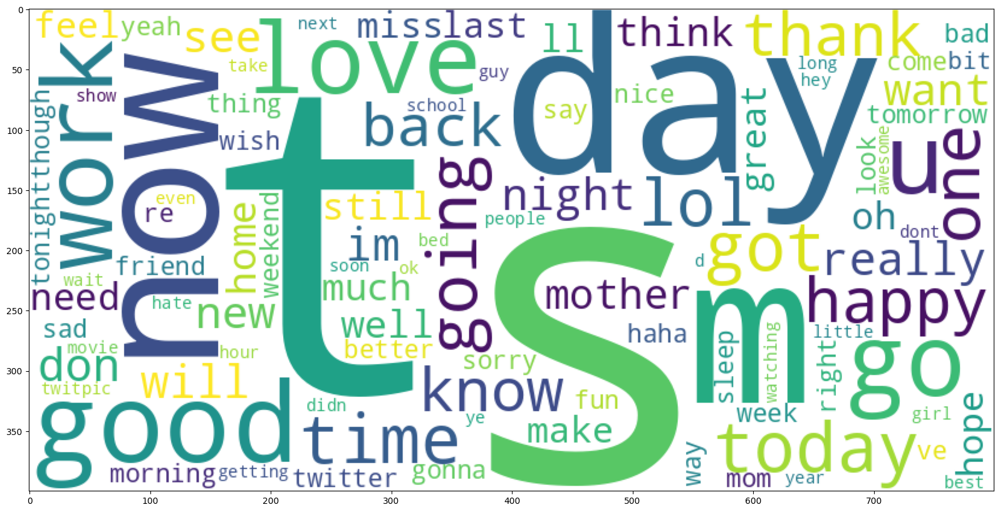

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

a = " ".join(clean_questions["text"])
print(a)

en_cloud = WordCloud(max_words=100, background_color='white',
                     width=800, height=400,
                     collocations=False).generate(a)
fig = plt.figure(figsize=(20, 10))
plt.imshow(en_cloud);

In [ ]:
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r'\w+')

clean_questions["tokens"] = clean_questions["text"].apply(tokenizer.tokenize)
clean_questions.head()

,Unnamed: 0,textID,text,selected_text,sentiment,tokens
0,0,cb774db0d1,"i`d have responded, if i were going","I`d have responded, if I were going",neutral,"[i, d, have, responded, if, i, were, going]"
1,1,549e992a42,sooo sad i will miss you here in san diego!!!,Sooo SAD,negative,"[sooo, sad, i, will, miss, you, here, in, san,..."
2,2,088c60f138,my boss is bullying me...,bullying me,negative,"[my, boss, is, bullying, me]"
3,3,9642c003ef,what interview! leave me alone,leave me alone,negative,"[what, interview, leave, me, alone]"
4,4,358bd9e861,"sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,"[sons, of, why, couldn, t, they, put, them, on..."


In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from  keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

all_words = [word for tokens in clean_questions["tokens"] for word in tokens]
sentence_lengths = [len(tokens) for tokens in clean_questions["tokens"]]
VOCAB = sorted(list(set(all_words)))
print("%s words total, with a vocabulary size of %s" % (len(all_words), len(VOCAB)))
print("Max sentence length is %s" % max(sentence_lengths))

367556 words total, with a vocabulary size of 26477
Max sentence length is 39


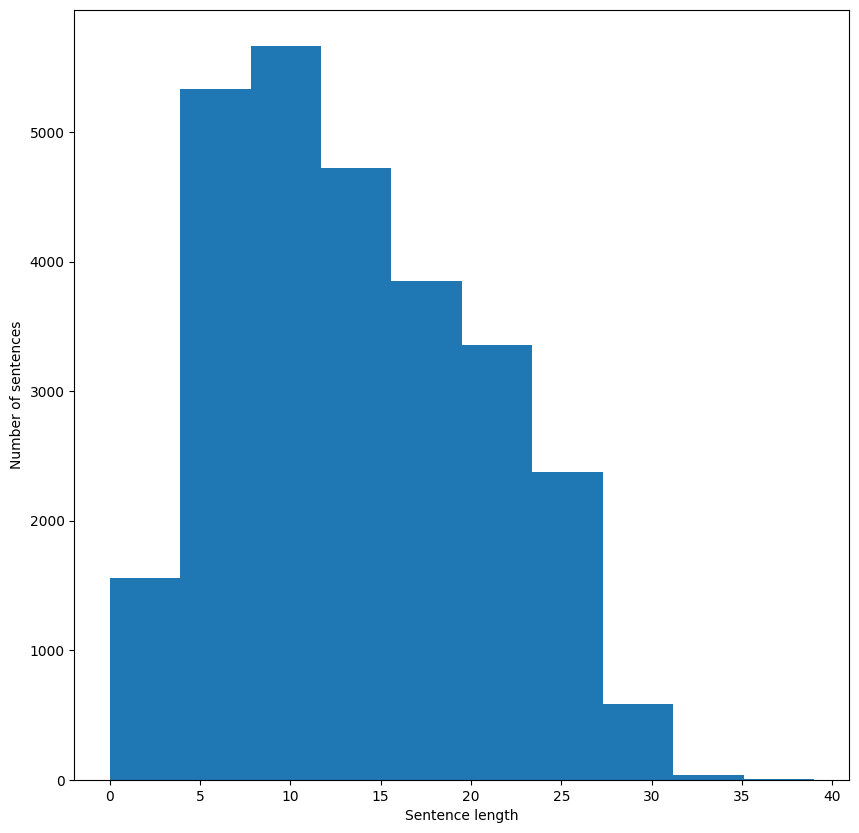

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 10))
plt.xlabel('Sentence length')
plt.ylabel('Number of sentences')
plt.hist(sentence_lengths)
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

def cv(data):
    count_vectorizer = CountVectorizer()
    emb = count_vectorizer.fit_transform(data)
    return emb, count_vectorizer



list_corpus = clean_questions["text"].tolist()
list_labels = clean_questions["sentiment"].tolist()

X_train, X_test, y_train, y_test = train_test_split(list_corpus, list_labels, test_size=0.2,
                                                                                random_state=40)

X_train_counts, count_vectorizer = cv(X_train)
X_test_counts = count_vectorizer.transform(X_test)

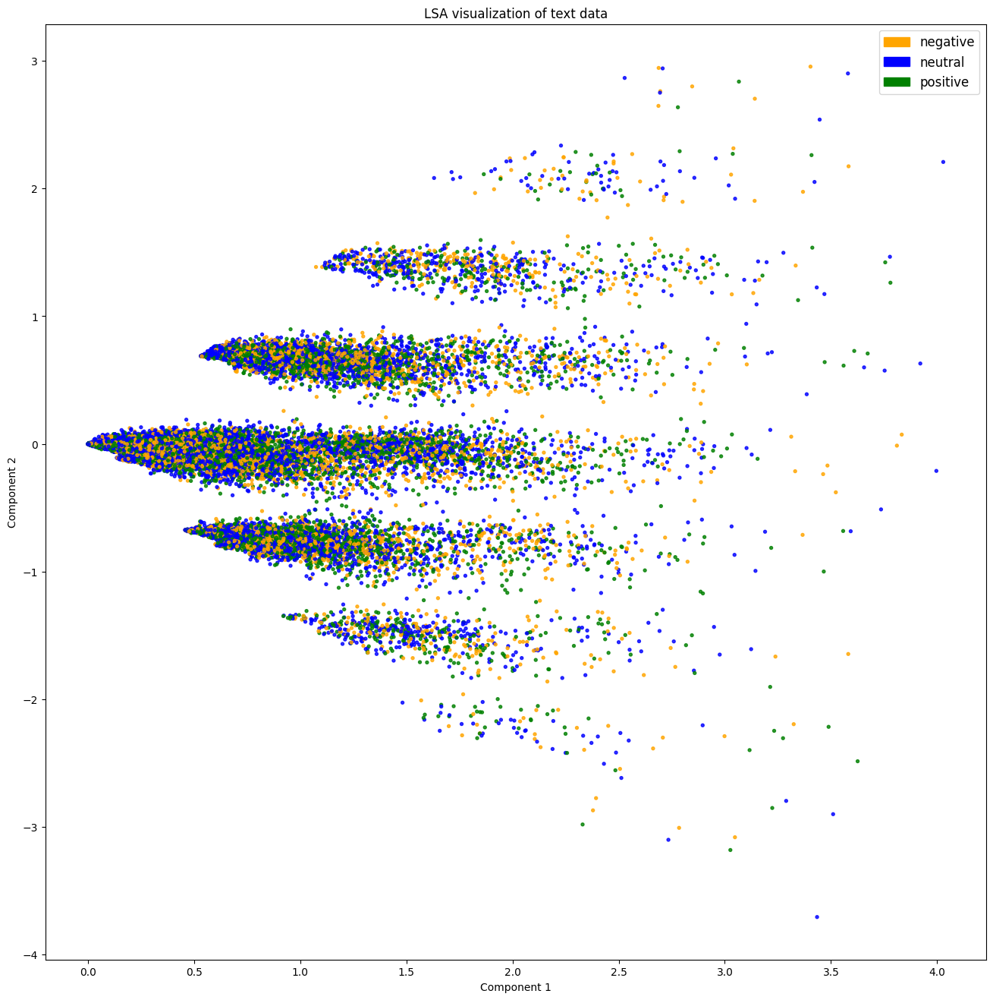

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.decomposition import TruncatedSVD
import numpy as np

def plot_LSA(test_data, test_labels, plot=True):
    lsa = TruncatedSVD(n_components=2)
    lsa.fit(test_data)
    lsa_scores = lsa.transform(test_data)

    # Создаем числовое отображение меток
    unique_labels = sorted(set(test_labels))
    label_to_num = {label: i for i, label in enumerate(unique_labels)}
    color_mapper = {label: idx for idx, label in enumerate(unique_labels)}
    color_column = [color_mapper[label] for label in test_labels]

    # Определяем цвета для каждой метки
    colors = ['orange', 'blue', 'green']  # Один цвет для каждой метки
    label_colors = {label: colors[i] for i, label in enumerate(unique_labels)}

    if plot:
        # Преобразуем метки в цвета
        point_colors = [label_colors[label] for label in test_labels]

        plt.scatter(lsa_scores[:, 0], lsa_scores[:, 1], s=8, alpha=.8, c=point_colors)

        # Создаем легенду
        patches = [mpatches.Patch(color=colors[i], label=label)
                  for i, label in enumerate(unique_labels)]
        plt.legend(handles=patches, prop={'size': 12})
        plt.title("LSA visualization of text data")
        plt.xlabel("Component 1")
        plt.ylabel("Component 2")

fig = plt.figure(figsize=(16, 16))
plot_LSA(X_train_counts, y_train)
plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', n_jobs=-1, random_state=40)
clf.fit(X_train_counts, y_train)

y_predicted_counts = clf.predict(X_test_counts)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report
import numpy as np

# Создаем и обучаем модель
clf = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', n_jobs=-1, random_state=40)
clf.fit(X_train_counts, y_train)

# Делаем предсказания
y_predicted_counts = clf.predict(X_test_counts)

def get_metrics(y_test, y_predicted):
    # true positives / (true positives+false positives)
    precision = precision_score(y_test, y_predicted, average='weighted')

    # true positives / (true positives + false negatives)
    recall = recall_score(y_test, y_predicted, average='weighted')

    # harmonic mean of precision and recall
    f1 = f1_score(y_test, y_predicted, average='weighted')

    # accuracy: true positives + true negatives / total
    accuracy = accuracy_score(y_test, y_predicted)

    return accuracy, precision, recall, f1

# Получаем метрики
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_counts)
print(f"accuracy = {accuracy:.3f}, precision = {precision:.3f}, recall = {recall:.3f}, f1 = {f1:.3f}")

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


accuracy = 0.648, precision = 0.648, recall = 0.648, f1 = 0.648


In [ ]:
import numpy as np
import itertools
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.winter):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=30)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize=20)
    plt.yticks(tick_marks, classes, fontsize=20)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center",
                 color="white" if cm[i, j] < thresh else "black", fontsize=40)

    plt.tight_layout()
    plt.ylabel('True label', fontsize=30)
    plt.xlabel('Predicted label', fontsize=30)

    return plt

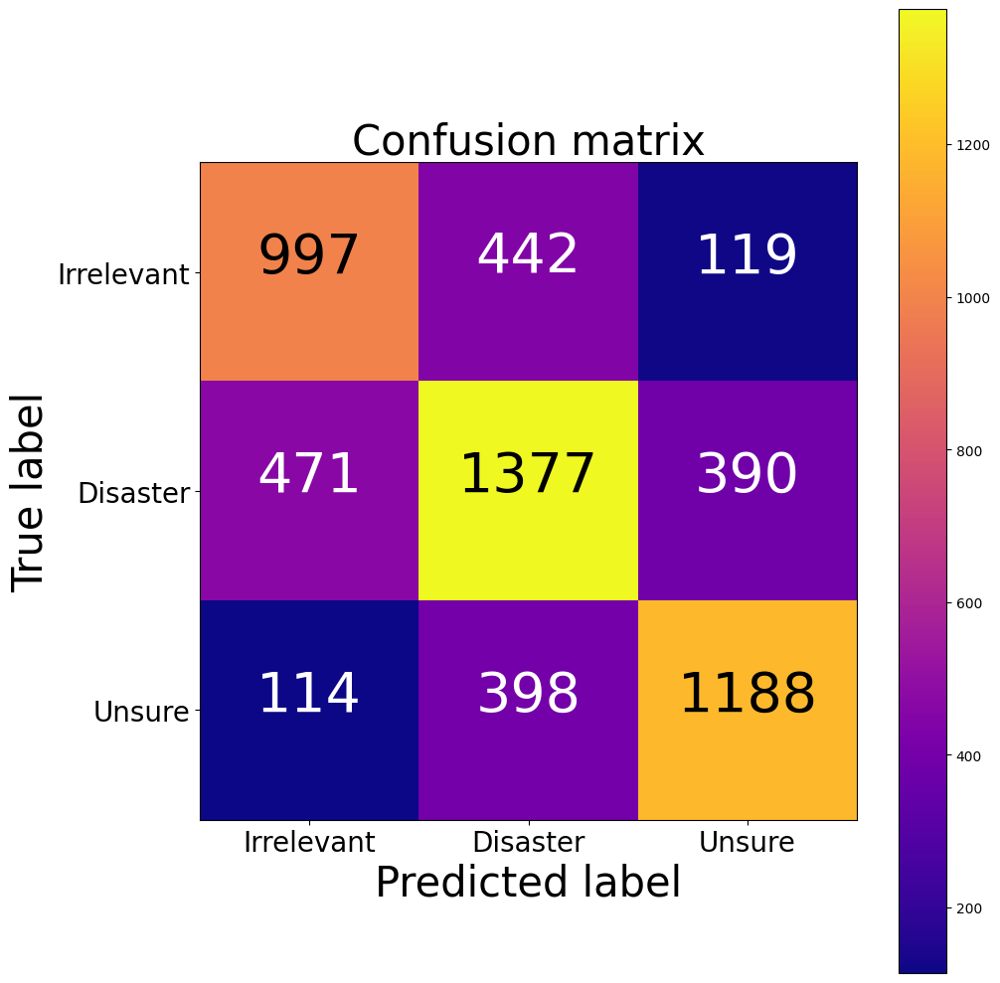

[[ 997  442  119]
 [ 471 1377  390]
 [ 114  398 1188]]


In [ ]:
cm = confusion_matrix(y_test, y_predicted_counts)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm, classes=['Irrelevant','Disaster','Unsure'], normalize=False, title='Confusion matrix', cmap="plasma")
plt.show()
print(cm)

In [ ]:
def get_most_important_features(vectorizer, model, n=5):
    index_to_word = {v:k for k,v in vectorizer.vocabulary_.items()}

    # loop for each class
    classes ={}
    for class_index in range(model.coef_.shape[0]):
        word_importances = [(el, index_to_word[i]) for i,el in enumerate(model.coef_[class_index])]
        sorted_coeff = sorted(word_importances, key = lambda x : x[0], reverse=True)
        tops = sorted(sorted_coeff[:n], key = lambda x : x[0])
        bottom = sorted_coeff[-n:]
        classes[class_index] = {
            'tops':tops,
            'bottom':bottom
        }
    return classes

importance = get_most_important_features(count_vectorizer, clf, 10)

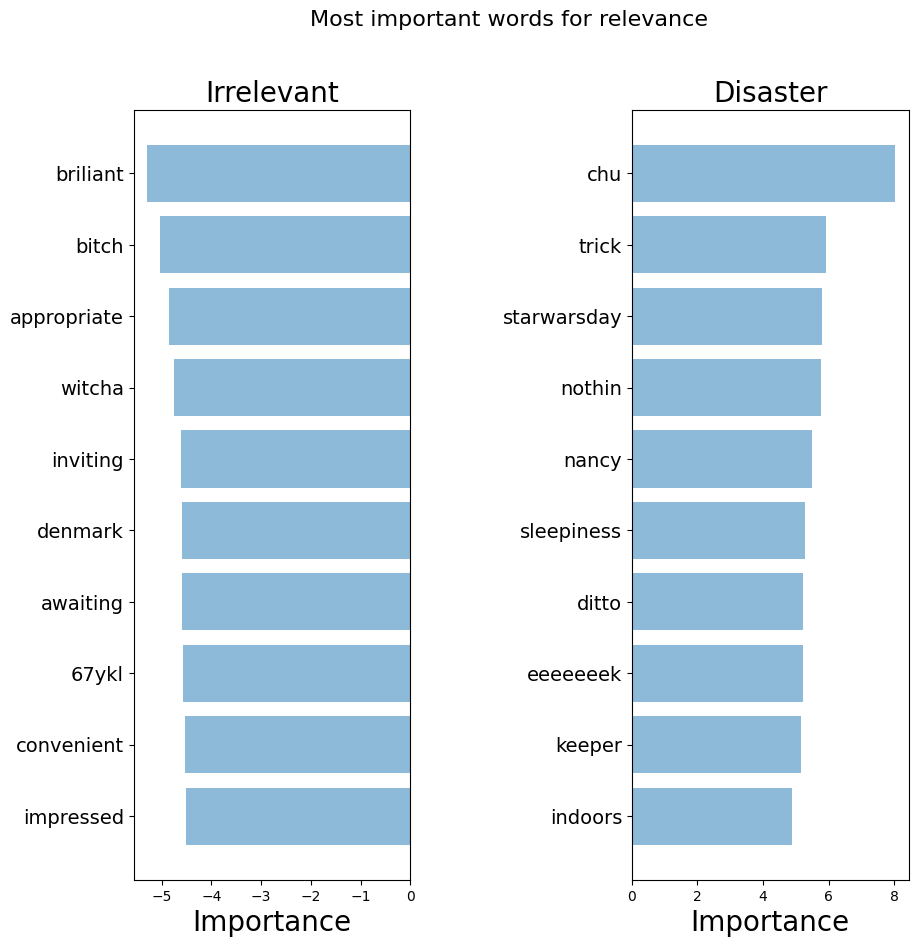

In [ ]:
def plot_important_words(top_scores, top_words, bottom_scores, bottom_words, name):
    y_pos = np.arange(len(top_words))
    top_pairs = [(a,b) for a,b in zip(top_words, top_scores)]
    top_pairs = sorted(top_pairs, key=lambda x: x[1])

    bottom_pairs = [(a,b) for a,b in zip(bottom_words, bottom_scores)]
    bottom_pairs = sorted(bottom_pairs, key=lambda x: x[1], reverse=True)

    top_words = [a[0] for a in top_pairs]
    top_scores = [a[1] for a in top_pairs]

    bottom_words = [a[0] for a in bottom_pairs]
    bottom_scores = [a[1] for a in bottom_pairs]

    fig = plt.figure(figsize=(10, 10))

    plt.subplot(121)
    plt.barh(y_pos,bottom_scores, align='center', alpha=0.5)
    plt.title('Irrelevant', fontsize=20)
    plt.yticks(y_pos, bottom_words, fontsize=14)
    plt.suptitle('Key words', fontsize=16)
    plt.xlabel('Importance', fontsize=20)

    plt.subplot(122)
    plt.barh(y_pos,top_scores, align='center', alpha=0.5)
    plt.title('Disaster', fontsize=20)
    plt.yticks(y_pos, top_words, fontsize=14)
    plt.suptitle(name, fontsize=16)
    plt.xlabel('Importance', fontsize=20)

    plt.subplots_adjust(wspace=0.8)
    plt.show()

top_scores = [a[0] for a in importance[1]['tops']]
top_words = [a[1] for a in importance[1]['tops']]
bottom_scores = [a[0] for a in importance[1]['bottom']]
bottom_words = [a[1] for a in importance[1]['bottom']]

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for relevance")

In [ ]:
def tfidf(data):
    tfidf_vectorizer = TfidfVectorizer()

    train = tfidf_vectorizer.fit_transform(data)

    return train, tfidf_vectorizer

X_train_tfidf, tfidf_vectorizer = tfidf(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

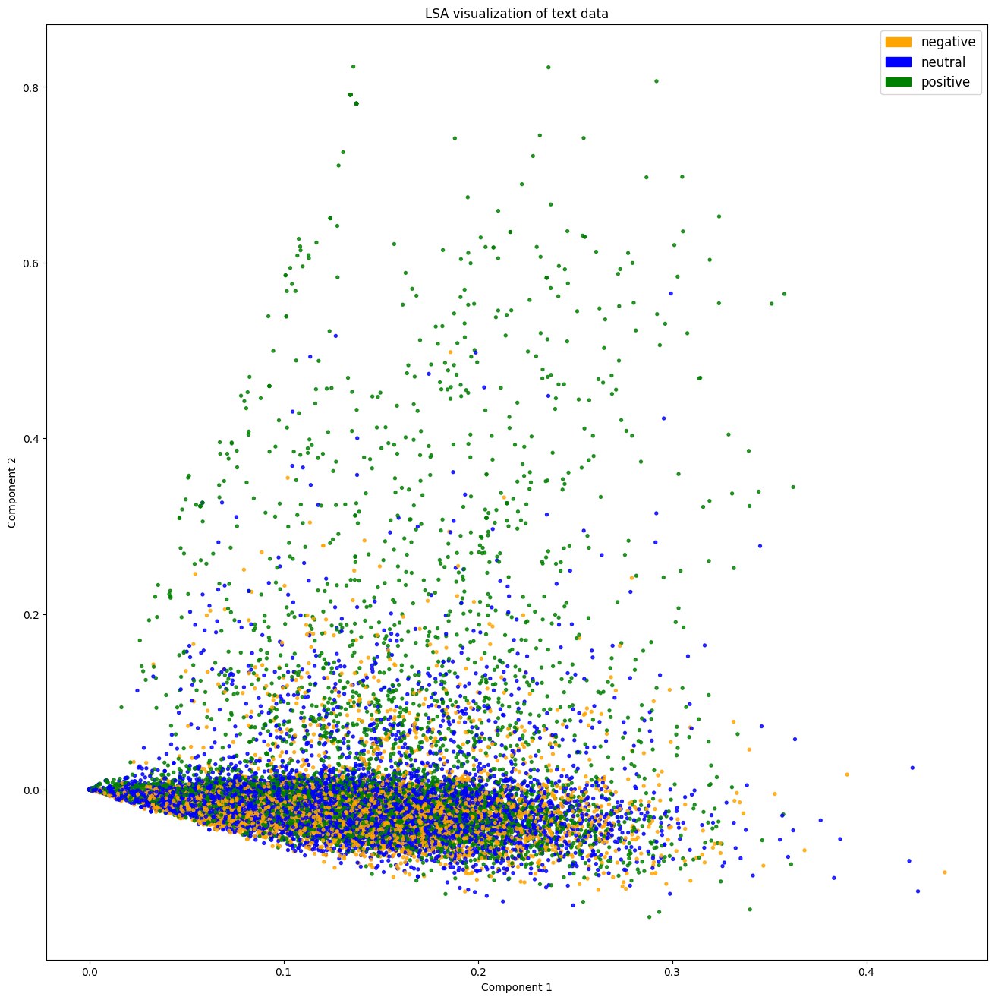

In [ ]:
fig = plt.figure(figsize=(16, 16))
plot_LSA(X_train_tfidf, y_train)
plt.show()

In [ ]:
clf_tfidf = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', n_jobs=-1, random_state=40)
clf_tfidf.fit(X_train_tfidf, y_train)

y_predicted_tfidf = clf_tfidf.predict(X_test_tfidf)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predicted_tfidf)

# Выводим результаты
print("TF-IDF Results:")
print(f"accuracy = {accuracy_tfidf:.3f}")
print(f"precision = {precision_tfidf:.3f}")
print(f"recall = {recall_tfidf:.3f}")
print(f"f1 = {f1_tfidf:.3f}")

TF-IDF Results:
accuracy = 0.658
precision = 0.658
recall = 0.658
f1 = 0.658


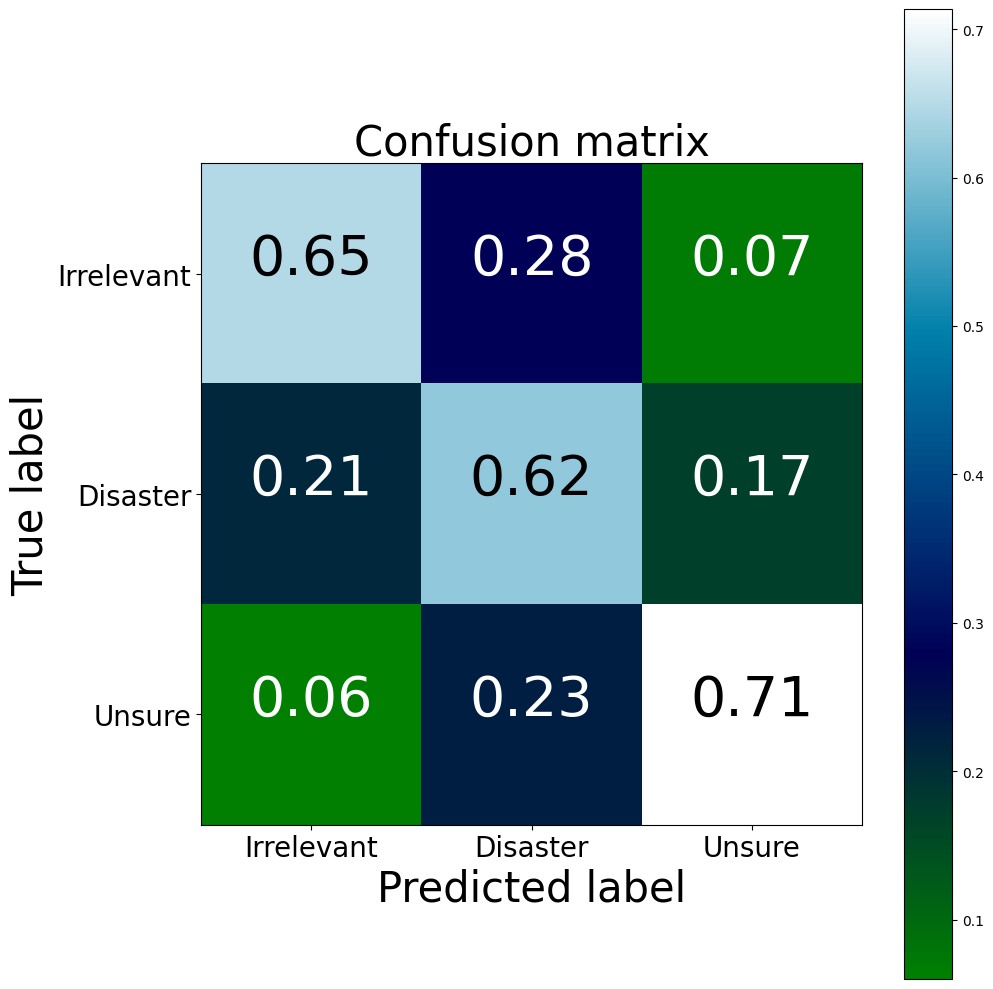

TFIDF confusion matrix
[[1012  437  109]
 [ 473 1390  375]
 [ 102  385 1213]]
BoW confusion matrix
[[ 997  442  119]
 [ 471 1377  390]
 [ 114  398 1188]]


In [ ]:
cm2 = confusion_matrix(y_test, y_predicted_tfidf)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm2, classes=['Irrelevant','Disaster','Unsure'], normalize=True, title='Confusion matrix', cmap="ocean")
plt.show()
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

In [ ]:
importance_tfidf = get_most_important_features(tfidf_vectorizer, clf_tfidf, 10)

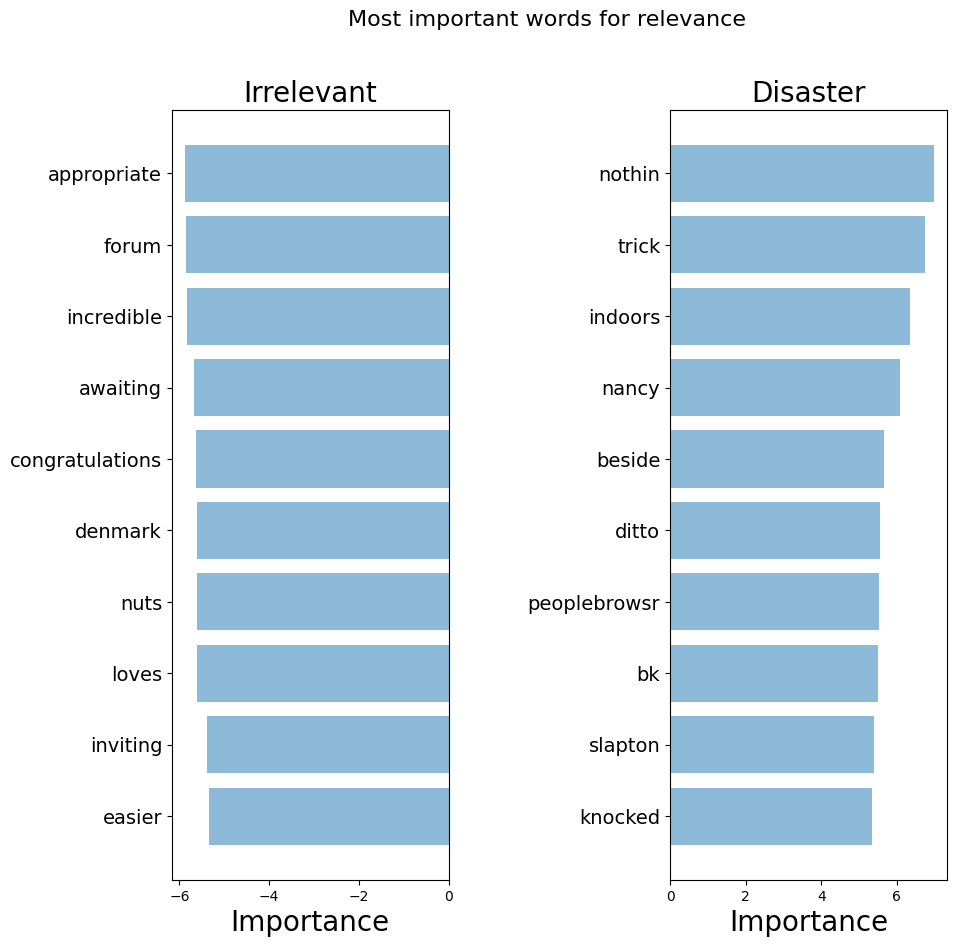

In [ ]:
top_scores = [a[0] for a in importance_tfidf[1]['tops']]
top_words = [a[1] for a in importance_tfidf[1]['tops']]
bottom_scores = [a[0] for a in importance_tfidf[1]['bottom']]
bottom_words = [a[1] for a in importance_tfidf[1]['bottom']]

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for relevance")

In [ ]:
!pip install gensim

# Загружаем модель Word2Vec
import gensim.downloader as api

# Скачиваем модель (занимает около 1.6 ГБ, будет долго)
print("Загрузка модели Word2Vec... Это может занять несколько минут...")
word2vec = api.load("word2vec-google-news-300")
print("Модель загружена!")

# Проверяем работу модели
print("Пример использования:")
print("Сходство между 'king' и 'queen':", word2vec.similarity('king', 'queen'))
print("Наиболее похожие слова на 'computer':", word2vec.most_similar('computer', topn=5))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 32.2 MB/s eta 0:00:00
Загрузка модели Word2Vec... Это может занять несколько минут...
[==================================================] 100.0% 1662.8/1662.8MB downloaded
Модель загружена!
Пример использования:
Сходство между 'king' и 'queen': 0.6510957
Наиболее похожие слова на 'computer': [('computers', 0.7979379892349243), ('laptop', 0.6640493273735046), ('laptop_computer', 0.6548868417739868), ('Computer', 0.647333562374115), ('com_puter', 0.6082080006599426)]


In [ ]:
def get_average_word2vec(tokens_list, vector, generate_missing=False, k=300):
    if len(tokens_list)<1:
        return np.zeros(k)
    if generate_missing:
        vectorized = [vector[word] if word in vector else np.random.rand(k) for word in tokens_list]
    else:
        vectorized = [vector[word] if word in vector else np.zeros(k) for word in tokens_list]
    length = len(vectorized)
    summed = np.sum(vectorized, axis=0)
    averaged = np.divide(summed, length)
    return averaged

def get_word2vec_embeddings(vectors, clean_questions, generate_missing=False):
    embeddings = clean_questions['tokens'].apply(lambda x: get_average_word2vec(x, vectors,
                                                                                generate_missing=generate_missing))
    return list(embeddings)

In [ ]:
embeddings = get_word2vec_embeddings(word2vec, clean_questions)
X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = train_test_split(embeddings, list_labels,
                                                                                        test_size=0.2, random_state=40)

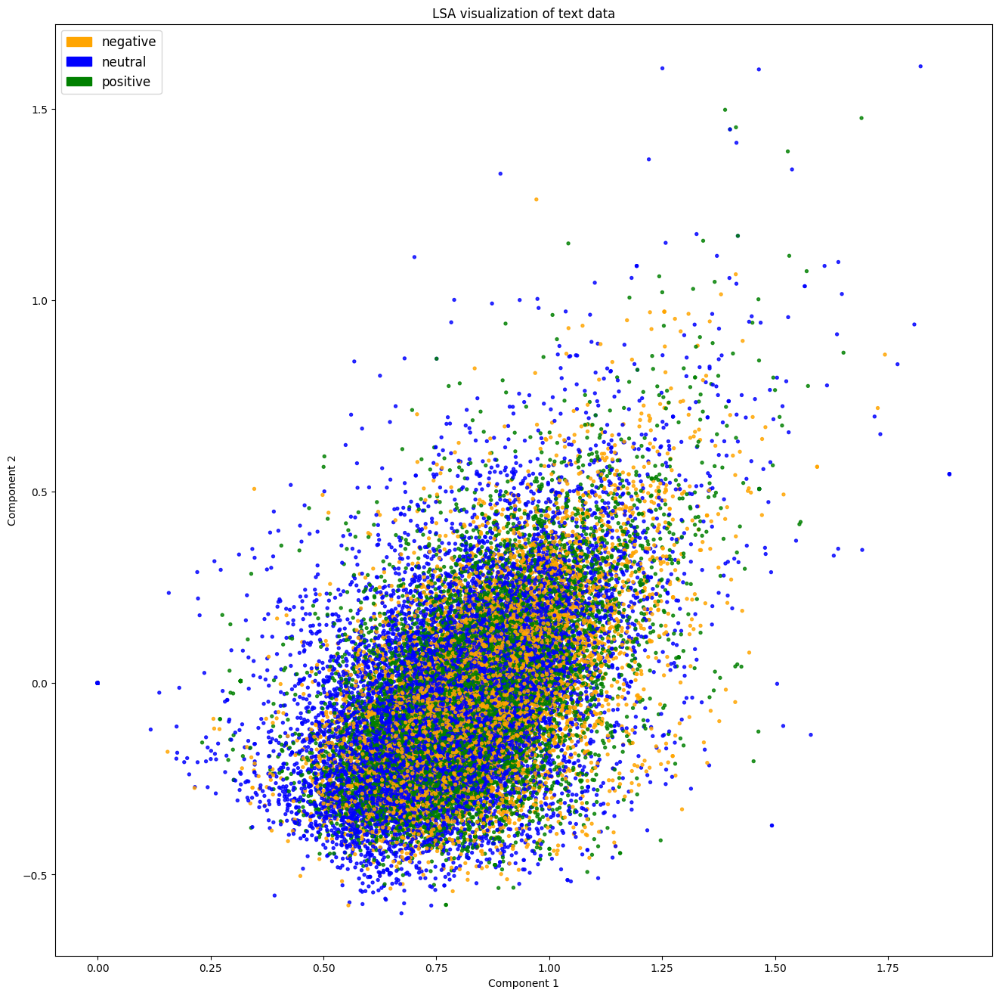

In [ ]:
fig = plt.figure(figsize=(16, 16))
plot_LSA(embeddings, list_labels)
plt.show()

In [ ]:
clf_w2v = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', random_state=40)
clf_w2v.fit(X_train_word2vec, y_train_word2vec)
y_predicted_word2vec = clf_w2v.predict(X_test_word2vec)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
def get_metrics(y_test, y_predicted):
    precision = precision_score(y_test, y_predicted, average='weighted')
    recall = recall_score(y_test, y_predicted, average='weighted')
    f1 = f1_score(y_test, y_predicted, average='weighted')
    accuracy = accuracy_score(y_test, y_predicted)
    return accuracy, precision, recall, f1

accuracy_word2vec, precision_word2vec, recall_word2vec, f1_word2vec = get_metrics(y_test, y_predicted_word2vec)

print("\nWord2Vec Results:")
print(f"accuracy = {accuracy_word2vec:.3f}")
print(f"precision = {precision_word2vec:.3f}")
print(f"recall = {recall_word2vec:.3f}")
print(f"f1 = {f1_word2vec:.3f}")


Word2Vec Results:
accuracy = 0.666
precision = 0.666
recall = 0.666
f1 = 0.666


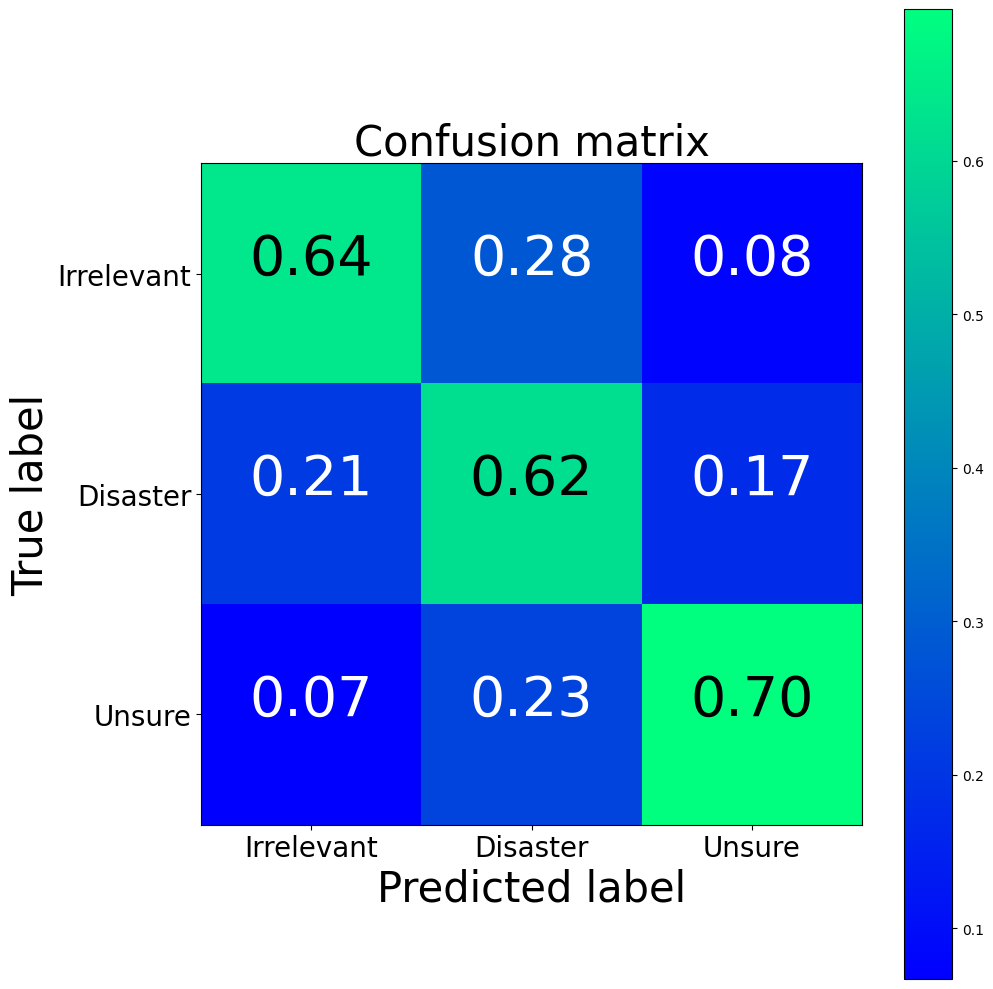

Word2Vec confusion matrix
[[1045  397  116]
 [ 476 1406  356]
 [ 116  376 1208]]
TFIDF confusion matrix
[[1012  437  109]
 [ 473 1390  375]
 [ 102  385 1213]]
BoW confusion matrix
[[ 997  442  119]
 [ 471 1377  390]
 [ 114  398 1188]]


In [ ]:
cm_w2v = confusion_matrix(y_test_word2vec, y_predicted_word2vec)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm, classes=['Irrelevant','Disaster','Unsure'], normalize=True, title='Confusion matrix')
plt.show()
print("Word2Vec confusion matrix")
print(cm_w2v)
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=56022e9346e40a6639e152e058eb49cb9672954f82c46d3def927037391374c9
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

X_train_data, X_test_data, y_train_data, y_test_data = train_test_split(
    list_corpus, list_labels, test_size=0.2, random_state=40
)

# Преобразуем метки в числовые (если они еще не числовые)
unique_labels = sorted(set(y_train_data))
label_to_num = {label: i for i, label in enumerate(unique_labels)}
num_to_label = {i: label for i, label in enumerate(unique_labels)}

y_train_data_num = [label_to_num[label] for label in y_train_data]
y_test_data_num = [label_to_num[label] for label in y_test_data]

# Определяем имена классов
class_names = list(unique_labels)  # ['negative', 'neutral', 'positive'] или другой порядок
print(f"Class names: {class_names}")

# Функция для усреднения Word2Vec векторов
def get_average_word2vec(tokens, word2vec_model, generate_missing=True, k=300):
    """
    Усредняет Word2Vec векторы для списка токенов
    """
    if len(tokens) < 1:
        return np.zeros(k)

    vectors = []
    for token in tokens:
        if token in word2vec_model:
            vectors.append(word2vec_model[token])
        elif generate_missing:
            vectors.append(np.random.uniform(-0.25, 0.25, k))

    if len(vectors) == 0:
        return np.zeros(k)

    return np.mean(vectors, axis=0)

vector_store = word2vec  # Предполагая, что word2vec модель уже загружена

# Функция для пайплайна Word2Vec
def word2vec_pipeline(texts):
    """
    Принимает список текстов, возвращает вероятности для каждого класса
    """
    global vector_store
    from nltk.tokenize import RegexpTokenizer

    tokenizer = RegexpTokenizer(r'\w+')
    tokenized_vectors = []

    for text in texts:
        # Токенизируем текст
        tokens = tokenizer.tokenize(text.lower())
        # Получаем усредненный вектор
        vector = get_average_word2vec(tokens, vector_store, generate_missing=True, k=vector_store.vector_size)
        tokenized_vectors.append(vector)

    # Преобразуем в массив
    vectors_array = np.array(tokenized_vectors)

    # Предсказываем вероятности
    probabilities = clf_w2v.predict_proba(vectors_array)
    return probabilities

# Создаем пайплайн для CountVectorizer (для сравнения)
c = make_pipeline(count_vectorizer, clf)

Class names: ['negative', 'neutral', 'positive']


In [ ]:
def explain_one_instance(instance, class_names):
    """
    Объясняет одно предсказание с помощью LIME
    """
    explainer = LimeTextExplainer(class_names=class_names)
    exp = explainer.explain_instance(
        instance,
        word2vec_pipeline,
        num_features=10,  # Можно увеличить для большего количества фич
        top_labels=len(class_names)
    )
    return exp

def visualize_one_exp(features, labels, index, class_names=None):
    """
    Визуализирует объяснение для одного экземпляра
    """
    if class_names is None:
        class_names = list(unique_labels)

    # Получаем объяснение
    exp = explain_one_instance(features[index], class_names=class_names)

    print(f'Index: {index}')
    print(f'Text: {features[index][:100]}...')  # Показываем первые 100 символов
    print(f'True class: {class_names[labels[index]]}')

    # Получаем предсказанную метку
    pred_probs = word2vec_pipeline([features[index]])[0]
    pred_class_idx = np.argmax(pred_probs)
    print(f'Predicted class: {class_names[pred_class_idx]}')
    print(f'Prediction probabilities: {dict(zip(class_names, pred_probs))}')

    # Показываем объяснение
    exp.show_in_notebook(text=True)

    return exp

# Тестируем на нескольких примерах
for i in [0, 10, 20, 30, 40, 65]:
    try:
        visualize_one_exp(X_test_data, y_test_data_num, i, class_names)
        print("\n" + "="*80 + "\n")
    except Exception as e:
        print(f"Error for index {i}: {e}")
        print("\n" + "="*80 + "\n")

Index: 0
Text:  ten hours ago, i was was sleeping, sorry....
True class: negative
Predicted class: negative
Prediction probabilities: {'negative': np.float64(0.902074658688627), 'neutral': np.float64(0.08405328872821599), 'positive': np.float64(0.013872052583156935)}




Index: 10
Text:   night boyssss...
True class: neutral
Predicted class: neutral
Prediction probabilities: {'negative': np.float64(0.09178782155629407), 'neutral': np.float64(0.8957823923778478), 'positive': np.float64(0.01242978606585798)}




Index: 20
Text:  yeah, i`m so excited....
True class: positive
Predicted class: positive
Prediction probabilities: {'negative': np.float64(0.0032641949441083516), 'neutral': np.float64(0.004767478920565361), 'positive': np.float64(0.9919683261353262)}




Index: 30
Text:  make a prank call for me...
True class: neutral
Predicted class: neutral
Prediction probabilities: {'negative': np.float64(0.32085251628045613), 'neutral': np.float64(0.6022663190124394), 'positive': np.float64(0.07688116470710446)}




Index: 40
Text: we`re home now...
True class: neutral
Predicted class: neutral
Prediction probabilities: {'negative': np.float64(0.09607774051612657), 'neutral': np.float64(0.7405252750791274), 'positive': np.float64(0.16339698440474604)}




Index: 65
Text: off to saigon in the morning, n hanoi from there........
True class: neutral
Predicted class: neutral
Prediction probabilities: {'negative': np.float64(0.12974766534209559), 'neutral': np.float64(0.5979351685825008), 'positive': np.float64(0.2723171660754035)}


In [ ]:
import random
from collections import defaultdict

random.seed(40)

def get_statistical_explanation(test_set, sample_size, word2vec_pipeline, label_dict):
    sample_sentences = random.sample(test_set, sample_size)
    explainer = LimeTextExplainer()

    labels_to_sentences = defaultdict(list)
    contributors = defaultdict(dict)

    # First, find contributing words to each class
    for sentence in sample_sentences:
        probabilities = word2vec_pipeline([sentence])
        curr_label = probabilities[0].argmax()
        labels_to_sentences[curr_label].append(sentence)
        exp = explainer.explain_instance(sentence, word2vec_pipeline, num_features=6, labels=[curr_label])
        listed_explanation = exp.as_list(label=curr_label)

        for word,contributing_weight in listed_explanation:
            if word in contributors[curr_label]:
                contributors[curr_label][word].append(contributing_weight)
            else:
                contributors[curr_label][word] = [contributing_weight]

    # average each word's contribution to a class, and sort them by impact
    average_contributions = {}
    sorted_contributions = {}
    for label,lexica in contributors.items():
        curr_label = label
        curr_lexica = lexica
        average_contributions[curr_label] = pd.Series(index=curr_lexica.keys())
        for word,scores in curr_lexica.items():
            average_contributions[curr_label].loc[word] = np.sum(np.array(scores))/sample_size
        detractors = average_contributions[curr_label].sort_values()
        supporters = average_contributions[curr_label].sort_values(ascending=False)
        sorted_contributions[label_dict[curr_label]] = {
            'detractors':detractors,
             'supporters': supporters
        }
    return sorted_contributions

label_to_text = {
    0: 'Irrelevant',
    1: 'Relevant',
    2: 'Unsure'
}
sorted_contributions = get_statistical_explanation(X_test_data, 100, word2vec_pipeline, label_to_text)

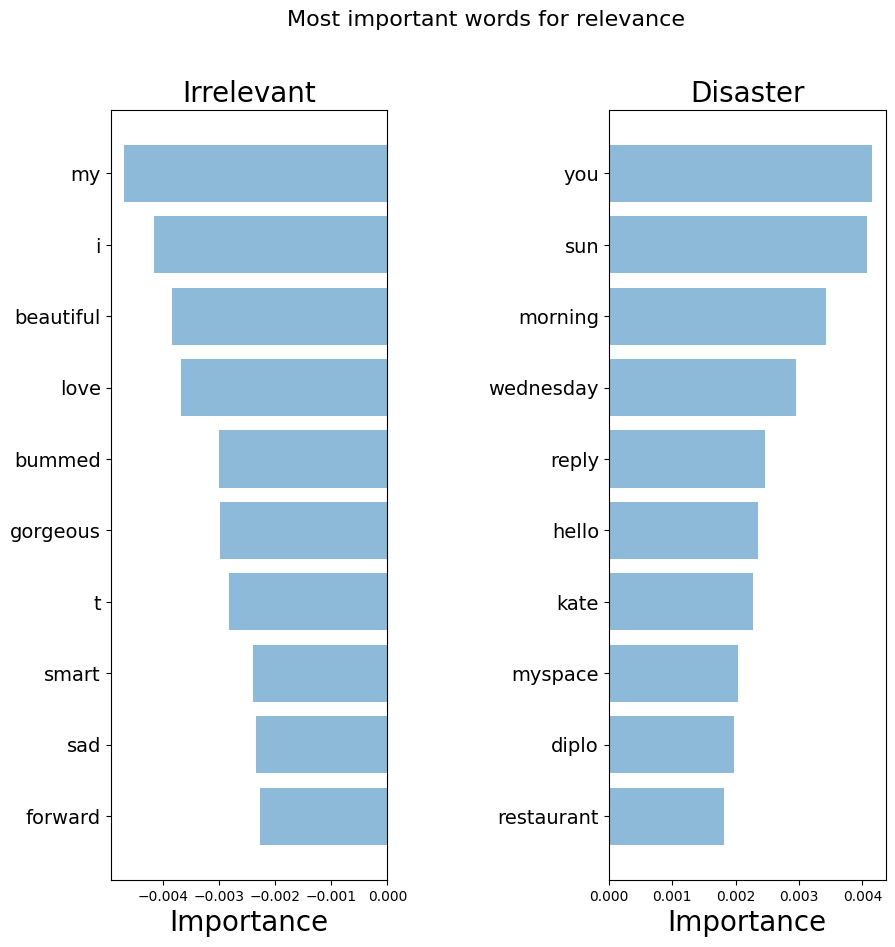

In [ ]:
# First index is the class (Disaster)
# Second index is 0 for detractors, 1 for supporters
# Third is how many words we sample
top_words = sorted_contributions['Relevant']['supporters'][:10].index.tolist()
top_scores = sorted_contributions['Relevant']['supporters'][:10].tolist()
bottom_words = sorted_contributions['Relevant']['detractors'][:10].index.tolist()
bottom_scores = sorted_contributions['Relevant']['detractors'][:10].tolist()

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for relevance")

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical

# Параметры
EMBEDDING_DIM = 300
MAX_SEQUENCE_LENGTH = 35
VOCAB_SIZE = len(VOCAB)
VALIDATION_SPLIT = 0.2

# 1. Преобразуем строковые метки в числовые
unique_labels = sorted(set(clean_questions["sentiment"]))
label_to_num = {label: i for i, label in enumerate(unique_labels)}
num_to_label = {i: label for i, label in enumerate(unique_labels)}

print(f"Labels mapping: {label_to_num}")

# Преобразуем метки
numeric_labels = clean_questions["sentiment"].map(label_to_num).values

# 2. Токенизация текста
tokenizer = Tokenizer(num_words=VOCAB_SIZE)
tokenizer.fit_on_texts(clean_questions["text"].tolist())
sequences = tokenizer.texts_to_sequences(clean_questions["text"].tolist())

word_index = tokenizer.word_index
print(f'Found {len(word_index)} unique tokens.')

# 3. Подготовка данных для CNN
cnn_data = pad_sequences(sequences, maxlen=MAX_SEQUENCE_LENGTH)
labels = to_categorical(numeric_labels, num_classes=len(unique_labels))

print(f"CNN data shape: {cnn_data.shape}")
print(f"Labels shape: {labels.shape}")

# 4. Перемешивание данных
indices = np.arange(cnn_data.shape[0])
np.random.shuffle(indices)
cnn_data = cnn_data[indices]
labels = labels[indices]

# 5. Создание embedding матрицы
# Сначала проверим, что word2vec модель доступна
try:
    word2vec_model = word2vec  # Предполагаем, что модель уже загружена
    print(f"Word2Vec model loaded, vector size: {word2vec_model.vector_size}")

    # Создаем embedding матрицу
    embedding_weights = np.zeros((len(word_index) + 1, EMBEDDING_DIM))

    found_count = 0
    not_found_count = 0

    for word, index in word_index.items():
        if word in word2vec_model:
            embedding_weights[index, :] = word2vec_model[word]
            found_count += 1
        else:
            # Для слов, отсутствующих в word2vec, используем случайные векторы
            embedding_weights[index, :] = np.random.normal(scale=0.6, size=(EMBEDDING_DIM,))
            not_found_count += 1

    print(f"Embedding matrix created: {embedding_weights.shape}")
    print(f"Words found in Word2Vec: {found_count}")
    print(f"Words not found: {not_found_count}")
    print(f"Coverage: {found_count/(found_count+not_found_count)*100:.2f}%")

except NameError:
    print("Word2Vec model not found. Using random initialization.")
    embedding_weights = np.random.normal(
        scale=0.6,
        size=(len(word_index) + 1, EMBEDDING_DIM)
    )
    print(f"Random embedding matrix created: {embedding_weights.shape}")

# 6. Разделение на train/validation
num_validation_samples = int(VALIDATION_SPLIT * cnn_data.shape[0])

x_train = cnn_data[:-num_validation_samples]
y_train = labels[:-num_validation_samples]

x_val = cnn_data[-num_validation_samples:]
y_val = labels[-num_validation_samples:]

print(f"\nTraining samples: {len(x_train)}")
print(f"Validation samples: {len(x_val)}")
print(f"Total samples: {len(x_train) + len(x_val)}")

Labels mapping: {'negative': 0, 'neutral': 1, 'positive': 2}
Found 26597 unique tokens.
CNN data shape: (27480, 35)
Labels shape: (27480, 3)
Word2Vec model loaded, vector size: 300
Embedding matrix created: (26598, 300)
Words found in Word2Vec: 16886
Words not found: 9711
Coverage: 63.49%

Training samples: 21984
Validation samples: 5496
Total samples: 27480


In [ ]:
from keras.layers import Dense, Input, Flatten, Dropout, Concatenate
from keras.layers import Conv1D, MaxPooling1D, Embedding
from keras.layers import LSTM, Bidirectional
from keras.models import Model

def ConvNet(embeddings, max_sequence_length, num_words, embedding_dim, labels_index, trainable=False, extra_conv=True):

    embedding_layer = Embedding(num_words,
                            embedding_dim,
                            weights=[embeddings],
                            input_length=max_sequence_length,
                            trainable=trainable)

    sequence_input = Input(shape=(max_sequence_length,), dtype='int32')
    embedded_sequences = embedding_layer(sequence_input)

    # Yoon Kim model (https://arxiv.org/abs/1408.5882)
    convs = []
    filter_sizes = [3,4,5]

    for filter_size in filter_sizes:
        l_conv = Conv1D(filters=128, kernel_size=filter_size, activation='relu')(embedded_sequences)
        l_pool = MaxPooling1D(pool_size=3)(l_conv)
        convs.append(l_pool)

    l_merge = Concatenate(axis=1)(convs)

    # add a 1D convnet with global maxpooling, instead of Yoon Kim model
    conv = Conv1D(filters=128, kernel_size=3, activation='relu')(embedded_sequences)
    pool = MaxPooling1D(pool_size=3)(conv)

    if extra_conv==True:
        x = Dropout(0.5)(l_merge)
    else:
        # Original Yoon Kim model
        x = Dropout(0.5)(pool)
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    #x = Dropout(0.5)(x)

    preds = Dense(labels_index, activation='softmax')(x)

    model = Model(sequence_input, preds)
    model.compile(loss='categorical_crossentropy',
                  optimizer='adam',
                  metrics=['acc'])

    return model

x_train = cnn_data[:-num_validation_samples]
y_train = labels[:-num_validation_samples]
x_val = cnn_data[-num_validation_samples:]
y_val = labels[-num_validation_samples:]

model = ConvNet(embedding_weights, MAX_SEQUENCE_LENGTH, len(word_index)+1, EMBEDDING_DIM,
                len(list(clean_questions["sentiment"].unique())), False)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [ ]:
model.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=3, batch_size=128)

Epoch 1/3
172/172 ━━━━━━━━━━━━━━━━━━━━ 65s 348ms/step - acc: 0.4096 - loss: 1.0867 - val_acc: 0.5986 - val_loss: 0.8573
Epoch 2/3
172/172 ━━━━━━━━━━━━━━━━━━━━ 39s 229ms/step - acc: 0.6394 - loss: 0.8003 - val_acc: 0.6610 - val_loss: 0.7628
Epoch 3/3
172/172 ━━━━━━━━━━━━━━━━━━━━ 35s 205ms/step - acc: 0.7035 - loss: 0.6887 - val_acc: 0.6779 - val_loss: 0.7436


In [ ]:
y_pred = model.predict(x_val)

172/172 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step


In [ ]:
y_pred_cnn = np.argmax(y_pred, axis=1)
y_val_cnn = np.argmax(y_val, axis=1)

In [ ]:
accuracy_cnn, precision_cnn, recall_cnn, f1_cnn = get_metrics(y_val_cnn, y_pred_cnn)
print(f"accuracy = {accuracy_cnn:.3f}, precision = {precision_cnn:.3f}, recall = {recall_cnn:.3f}, f1 = {f1_cnn:.3f}")

accuracy = 0.678, precision = 0.680, recall = 0.678, f1 = 0.676


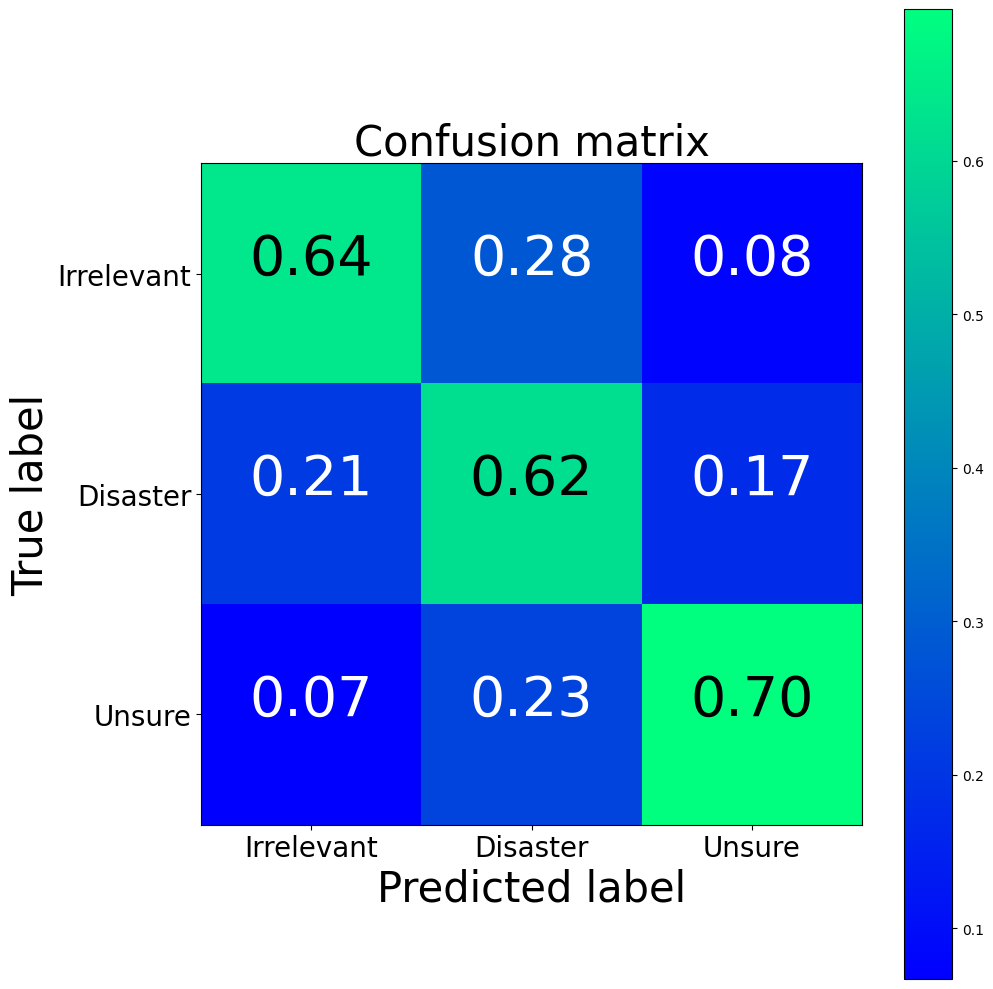

CNN confusion matrix
[[ 882  532  128]
 [ 273 1526  427]
 [  79  331 1318]]
Word2Vec confusion matrix
[[1045  397  116]
 [ 476 1406  356]
 [ 116  376 1208]]
TFIDF confusion matrix
[[1012  437  109]
 [ 473 1390  375]
 [ 102  385 1213]]
BoW confusion matrix
[[ 997  442  119]
 [ 471 1377  390]
 [ 114  398 1188]]


In [ ]:
cm_cnn = confusion_matrix(y_val_cnn, y_pred_cnn)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm, classes=['Irrelevant','Disaster','Unsure'], normalize=True, title='Confusion matrix')
plt.show()

print("CNN confusion matrix")
print(cm_cnn)
print("Word2Vec confusion matrix")
print(cm_w2v)
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)